In [1]:
# Plot surrogate predictions and calibrated models

import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import json

from diff_evolution_col import *


def load_json(filename):
    with open(filename) as f:
        return json.load(f)
    


In [2]:
# Load surrogate predictions from quoFEM
surrogate_data = pd.read_csv('surrogate_predictions_noflexure_alldata.csv')

# Show surrogate data
#surrogate_data.head()
surrogate_data.iloc[:, 7+14:21+14].head()

FileNotFoundError: [Errno 2] No such file or directory: 'surrogate_predictions_noflexure_alldata.csv'

In [19]:
# Load calibrated parameters data
cal_params = pd.read_csv('cal_params_noflexure.txt', sep="\t")

# Show calibrated parameters data
cal_params.head()

,% eta1,kappa_k,kappa,sig,lam,mup,sigp,rsmax,n,alpha,alpha1,alpha2,betam1,gamma
0,0.86764,5.35541,0.99576,0.27399,0.85096,4.24929,4.64015,0.67891,2.33701,0.00318,3.71372,0.07078,0.00441,0.85111
1,1.12162,1.41120,0.95396,0.49300,0.17025,0.12367,0.96745,0.87296,1.86962,0.00207,8.63085,0.78397,0.00229,1.62312
2,1.07334,0.51592,1.04498,0.18482,0.24935,3.63674,3.36884,0.67157,5.08198,0.00527,2.32308,0.96931,0.03738,0.18040
3,1.53376,0.52829,0.99104,0.22865,0.66558,3.70566,1.40844,0.51435,5.61389,0.02470,4.46387,0.33828,0.00715,0.26729
4,1.67245,0.56338,0.97100,0.65020,0.32116,1.11073,1.01267,0.98957,3.74881,0.02214,3.86296,1.08286,0.02080,0.32168


0
[8.67640e-01 5.35541e+00 9.95760e-01 2.73990e-01 8.50960e-01 4.24929e+00
 4.64015e+00 6.78910e-01 2.33701e+00 3.18000e-03 3.71372e+00 7.07800e-02
 4.41000e-03 8.51110e-01]
[1.2486    1.3262    1.0066    0.3214    0.63906   2.3833    2.3871
 0.71351   3.3341    0.014819  2.9414    0.60399   0.0090561 0.5552   ]


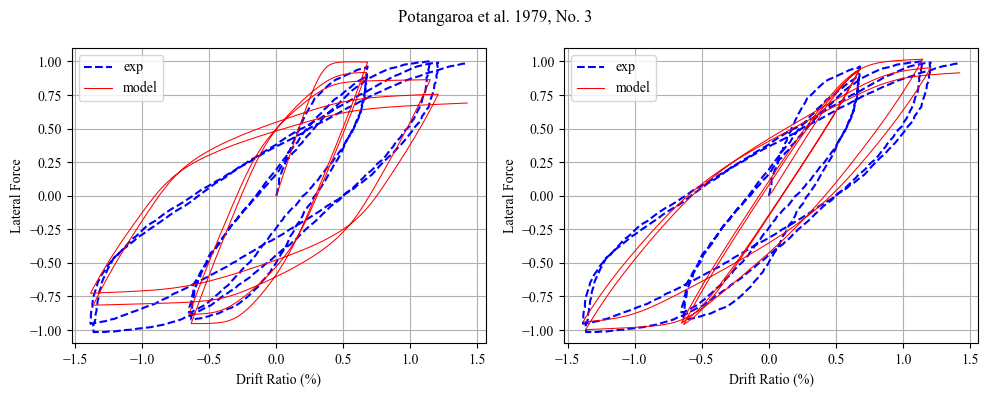



1
[1.12162e+00 1.41120e+00 9.53960e-01 4.93000e-01 1.70250e-01 1.23670e-01
 9.67450e-01 8.72960e-01 1.86962e+00 2.07000e-03 8.63085e+00 7.83970e-01
 2.29000e-03 1.62312e+00]
[1.2486   1.5125   1.0066   0.55112  0.36818  2.47     2.3878   0.69651
 3.3341   0.010497 7.9334   0.78316  0.012422 0.556   ]


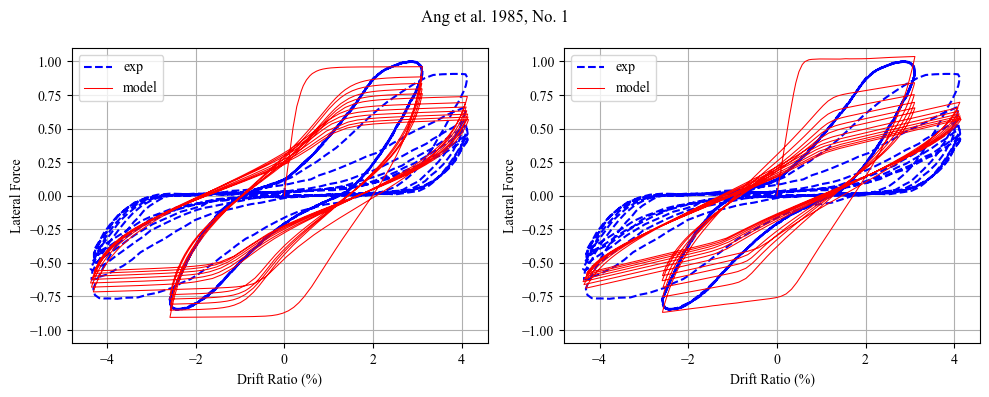



2
[1.07334 0.51592 1.04498 0.18482 0.24935 3.63674 3.36884 0.67157 5.08198
 0.00527 2.32308 0.96931 0.03738 0.1804 ]
[1.5945    1.3602    1.0139    0.32037   0.36719   2.0227    2.0589
 0.7134    2.334     0.0063754 2.6003    0.83547   0.018437  0.214    ]


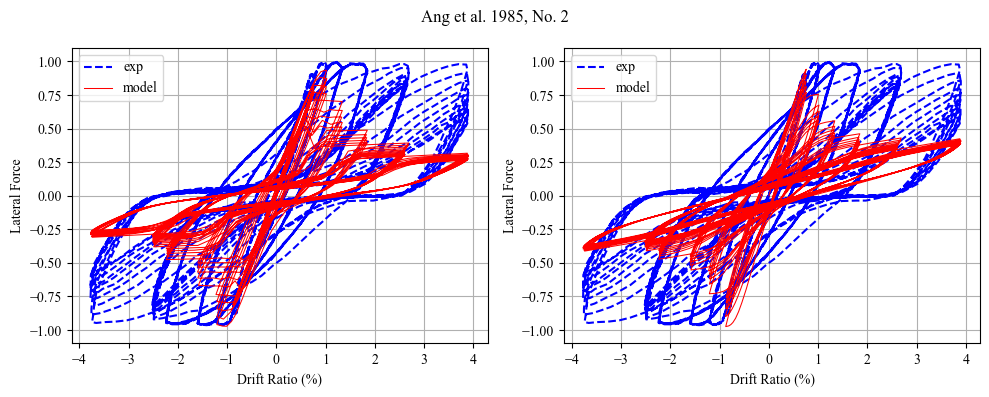



3
[1.53376 0.52829 0.99104 0.22865 0.66558 3.70566 1.40844 0.51435 5.61389
 0.0247  4.46387 0.33828 0.00715 0.26729]
[1.5214   1.4089   0.99884  0.31878  0.59613  2.359    2.2065   0.71399
 4.4511   0.012663 3.8878   0.75939  0.010201 0.19146 ]


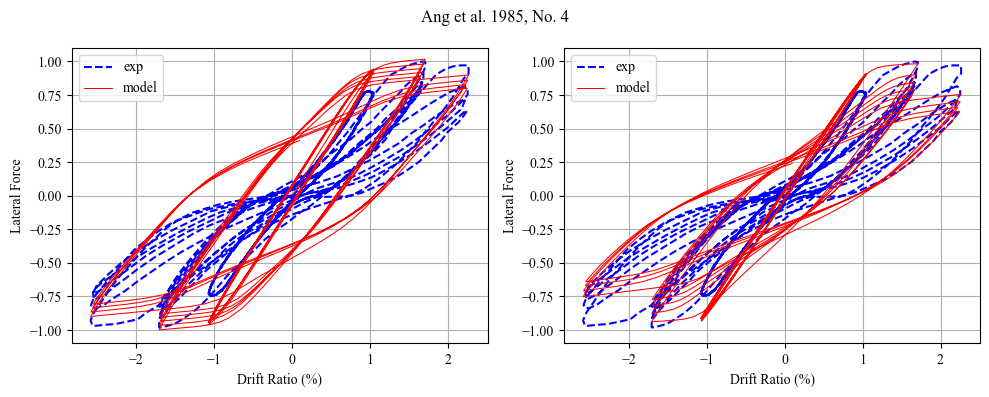



4
[1.67245 0.56338 0.971   0.6502  0.32116 1.11073 1.01267 0.98957 3.74881
 0.02214 3.86296 1.08286 0.0208  0.32168]
[1.2168    0.79452   1.0066    0.31754   0.30203   2.2491    2.3876
 0.7222    3.3341    0.0066229 1.7721    0.88463   0.027235  0.31169  ]


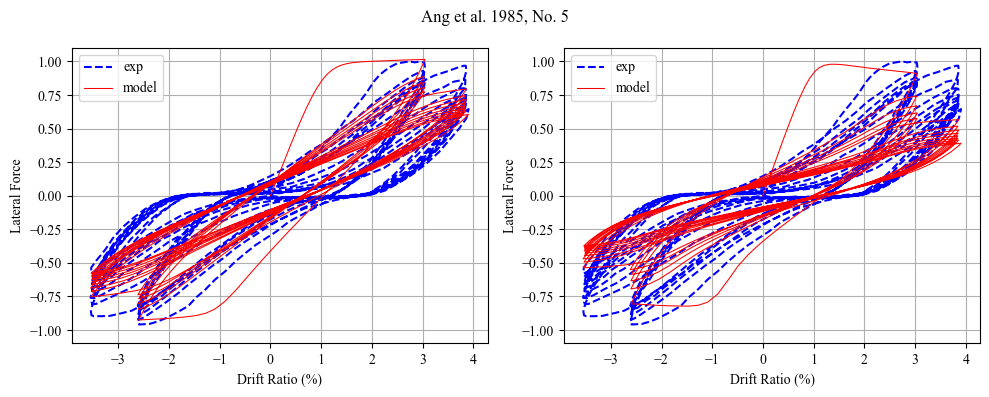



5
[1.16838 0.73678 1.02518 0.087   0.23723 3.50942 4.40043 0.86413 3.31474
 0.01091 2.43309 0.52226 0.0152  0.2577 ]
[1.2786    0.84913   1.0066    0.32465   0.36227   2.1868    2.4404
 0.71254   3.3341    0.0092238 3.2336    0.76362   0.010508  0.556    ]


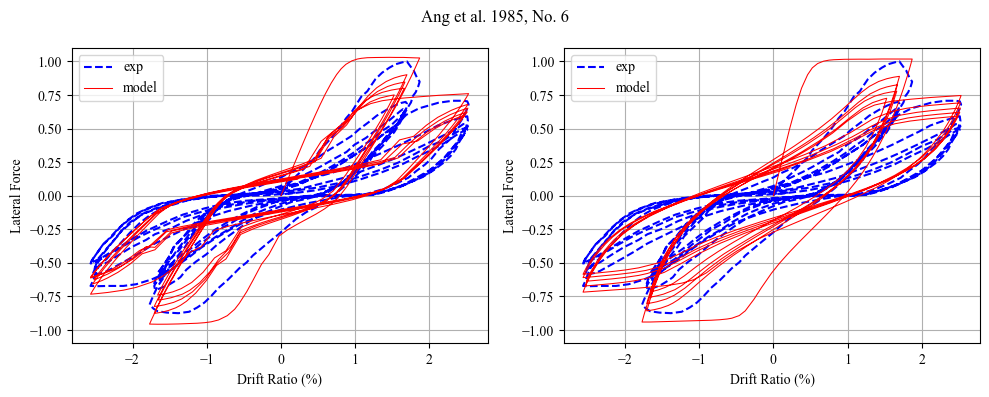



6
[1.75618e+00 1.51231e+00 1.03440e+00 2.57530e-01 3.65690e-01 1.63651e+00
 7.77940e-01 7.34500e-01 1.37458e+00 3.30000e-03 3.69125e+00 2.60050e-01
 1.28100e-02 1.46950e-01]
[1.2732    0.6278    1.0086    0.31853   0.32981   2.2482    2.421
 0.71229   3.2847    0.0044874 1.9239    0.90231   0.026196  0.21964  ]


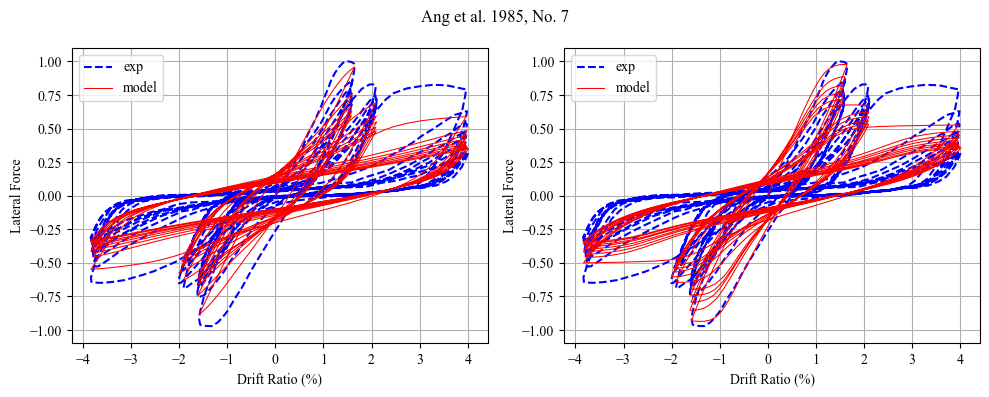



7
[1.58732 0.56408 1.00253 0.03625 0.14778 1.92856 3.39036 0.9122  2.0803
 0.00943 1.54031 0.35659 0.02604 1.10885]
[1.4246    0.76652   1.0155    0.32776   0.36545   2.1841    1.8297
 0.76749   2.7006    0.0042147 2.6674    0.67343   0.027007  1.1718   ]


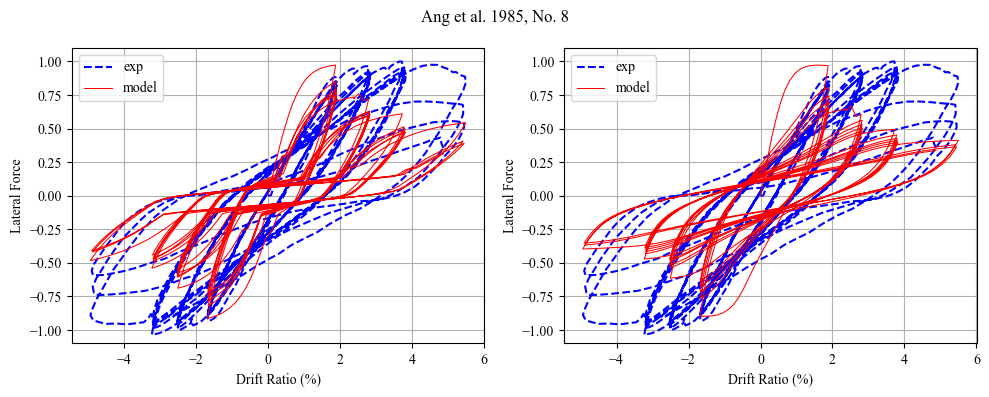



8
[1.62623e+00 8.25580e-01 1.03804e+00 2.96230e-01 6.01160e-01 4.86255e+00
 2.74859e+00 8.79650e-01 1.21938e+00 1.17300e-02 3.34024e+00 3.48230e-01
 2.17000e-03 1.87400e-01]
[1.2477    1.1834    1.0096    0.42902   0.33841   3.24      2.3479
 0.71512   3.1929    0.0086716 1.8844    0.72018   0.012177  0.556    ]


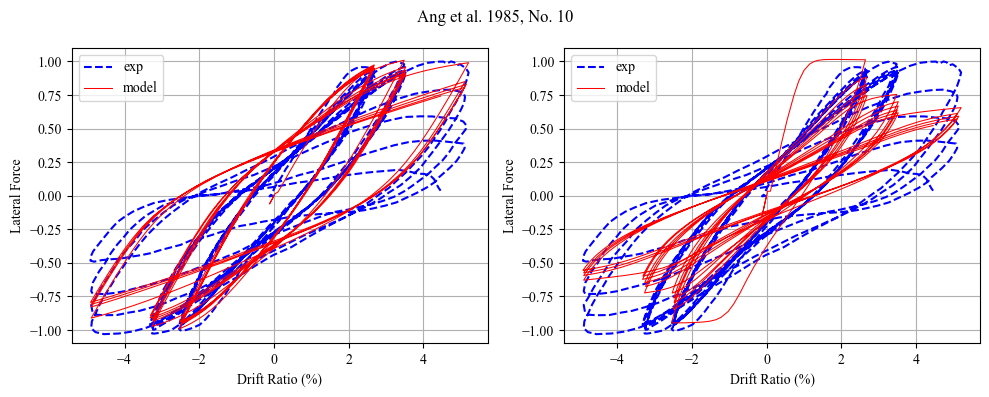



9
[1.49654e+00 1.62323e+00 1.01904e+00 8.95290e-01 5.85080e-01 4.43475e+00
 1.99639e+00 3.48460e-01 2.68106e+00 7.36000e-03 9.51840e-01 4.64020e-01
 4.15000e-03 2.10400e-01]
[1.1169    1.8877    1.0089    0.43259   0.29626   3.476     1.5654
 0.72529   3.2159    0.0099025 1.5713    0.7988    0.018581  0.53675  ]


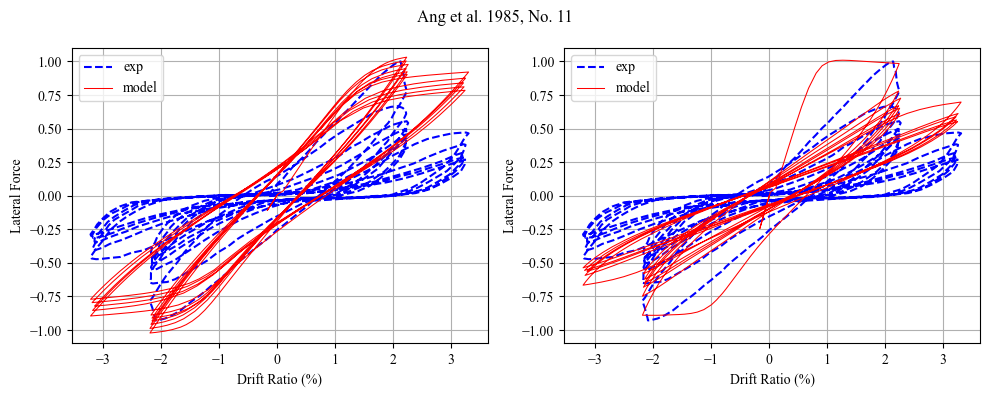



10
[5.10560e-01 1.35851e+00 9.87730e-01 6.36200e-02 3.94900e-01 3.78820e+00
 1.06497e+00 7.36440e-01 2.10306e+00 3.33000e-03 2.59421e+00 8.38910e-01
 4.54500e-02 2.54200e-01]
[1.2942   1.1951   1.0008   0.44038  0.31603  3.3304   2.1476   0.74993
 3.489    0.005061 2.6405   0.69882  0.023862 0.53396 ]


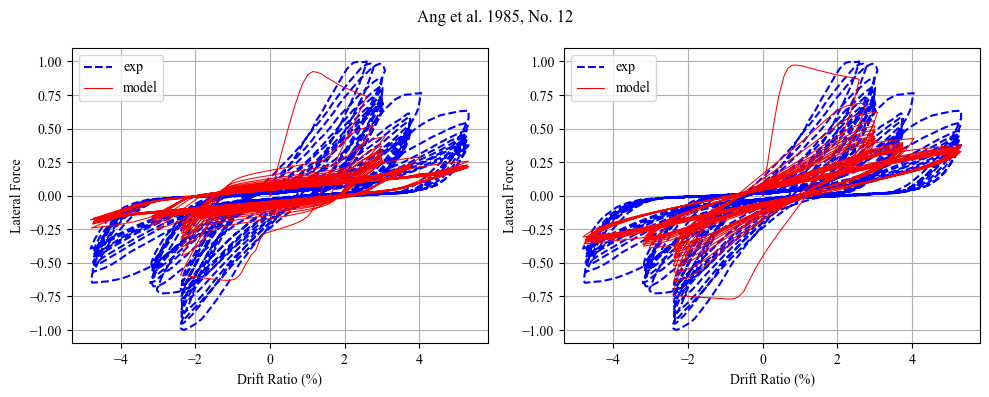



11
[1.13138e+00 7.00600e-01 1.00915e+00 5.51450e-01 3.50620e-01 1.90948e+00
 1.49978e+00 9.29140e-01 3.11341e+00 1.76000e-03 1.82667e+00 7.85870e-01
 1.46200e-02 3.00330e-01]
[1.2484    2.1681    1.0069    0.334     0.28843   2.1262    2.445
 0.76095   3.3341    0.0070508 2.085     0.75447   0.01087   0.30501  ]


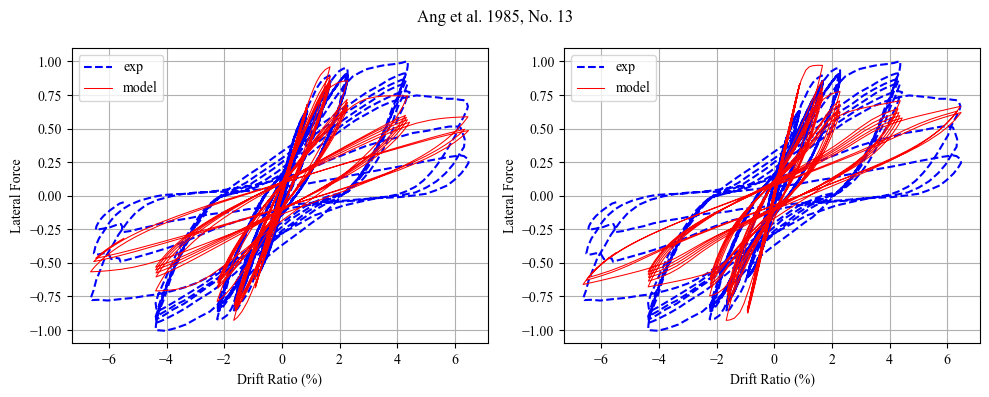



12
[0.88048 0.65808 1.03423 0.35575 0.09645 0.70103 2.89824 0.61207 1.00559
 0.01423 3.98822 0.52462 0.01202 0.28256]
[1.2849    1.1015    1.0099    0.33837   0.37505   2.4348    1.8264
 0.71336   3.2059    0.0094357 4.6243    0.67663   0.010149  0.32133  ]


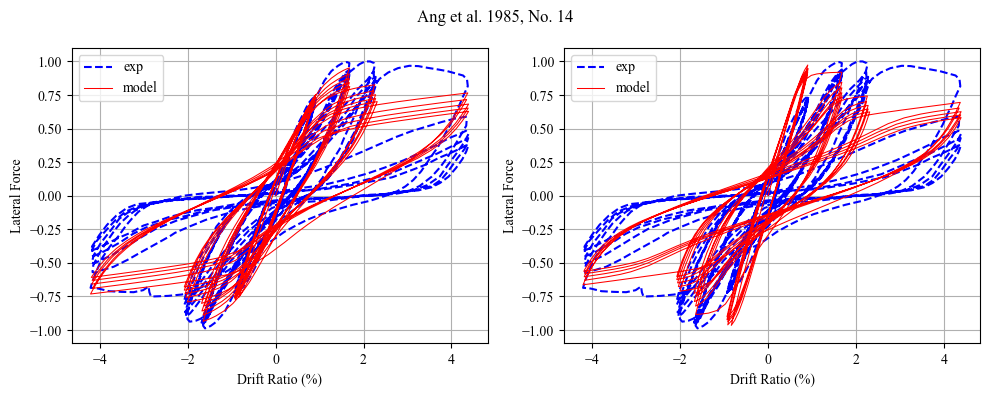



13
[1.84665e+00 1.62723e+00 1.02044e+00 5.57800e-01 3.47110e-01 3.84410e-01
 2.53177e+00 9.35000e-01 1.60548e+00 1.57000e-03 1.85364e+00 1.26761e+00
 1.14600e-02 1.29210e-01]
[1.4732    0.68039   1.0241    0.30698   0.32844   2.3546    2.241
 0.85527   4.5348    0.0063794 3.3711    0.71409   0.020867  0.22379  ]


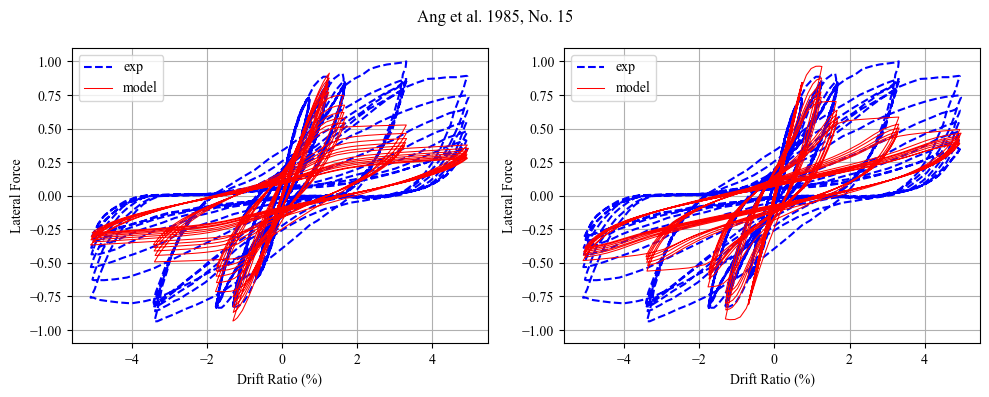



14
[1.82286e+00 8.62230e-01 9.68940e-01 4.40420e-01 7.08120e-01 1.96662e+00
 2.00664e+00 8.61010e-01 5.22718e+00 9.10000e-04 1.26644e+00 3.89680e-01
 3.05000e-03 2.74380e-01]
[1.4764    1.3702    1.0034    0.31117   0.63115   2.5996    2.0148
 0.71311   4.6222    0.015381  3.9814    0.50922   0.0095314 0.1889   ]


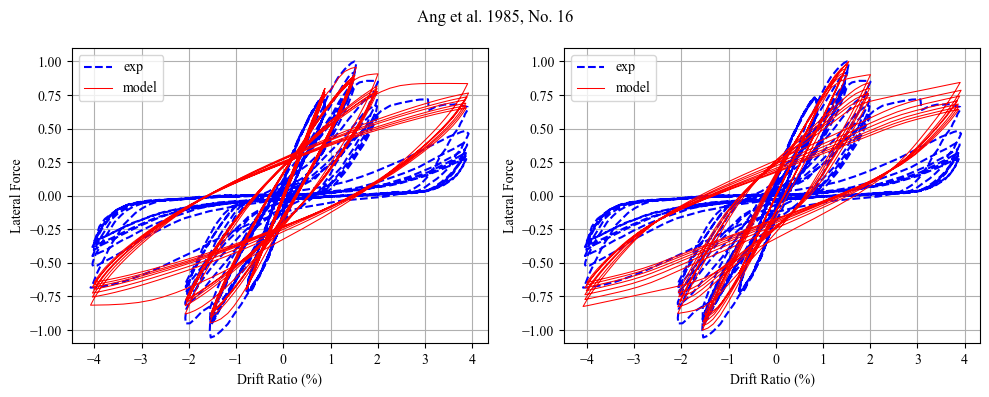



15
[1.57718e+00 3.28458e+00 9.75680e-01 4.84260e-01 6.15120e-01 4.39709e+00
 3.94141e+00 7.70280e-01 7.78050e+00 3.90000e-04 1.82861e+00 6.77860e-01
 7.75000e-03 1.67410e-01]
[1.2632    1.2395    1.0051    0.33508   0.26934   2.6511    3.4467
 0.6976    3.2262    0.0048566 2.9407    0.80263   0.024739  0.19535  ]


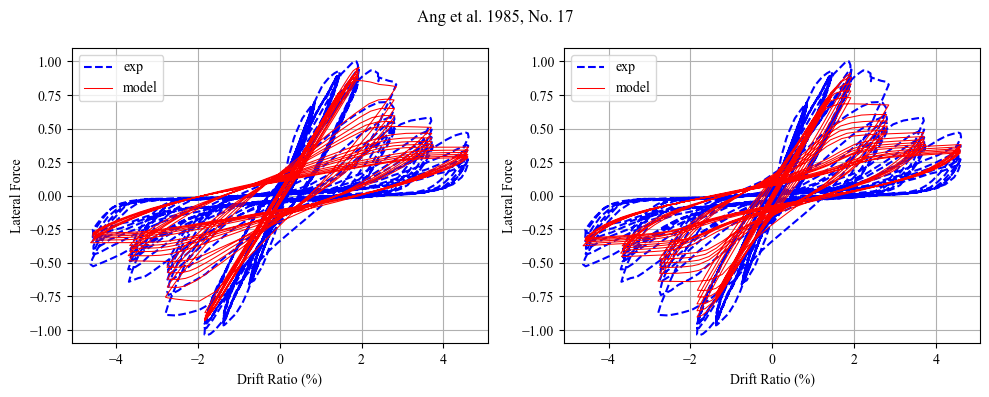



16
[7.22600e-01 2.02132e+00 1.03854e+00 1.96990e-01 2.23410e-01 4.96740e+00
 4.92055e+00 9.91700e-01 2.90027e+00 2.70000e-03 5.39629e+00 2.25530e-01
 9.30000e-03 2.17900e-01]
[1.2423    1.5669    1.009     0.34322   0.37796   2.5258    3.7994
 0.88238   3.3341    0.0056616 2.174     0.96763   0.021885  0.17107  ]


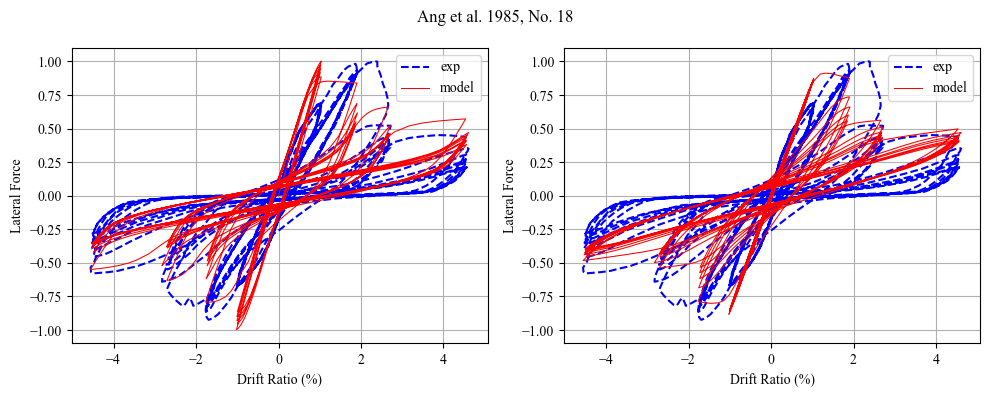



17
[0.76472 0.64896 1.0175  0.22023 0.28184 2.71224 1.60361 0.39609 2.52239
 0.00381 1.05011 1.24048 0.03348 0.14207]
[1.2212    1.3999    1.0127    0.34249   0.39115   2.4302    2.7664
 0.68016   3.2147    0.0042141 1.5728    0.78765   0.025567  0.2075   ]


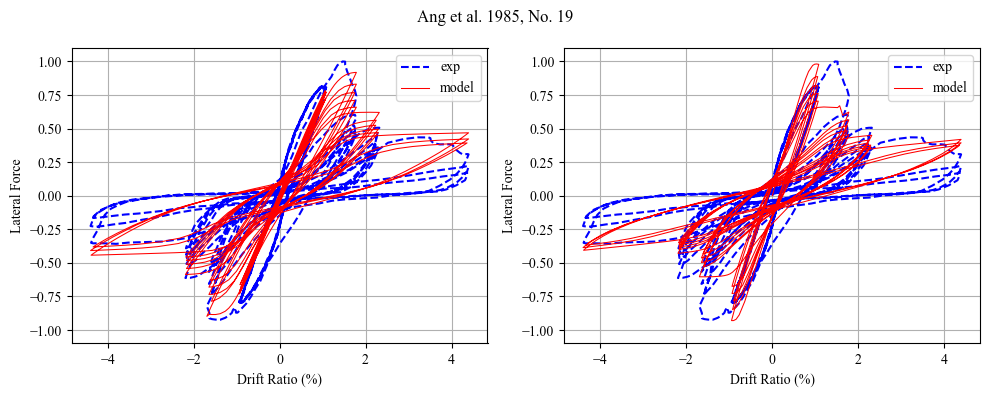



18
[8.61520e-01 8.01680e-01 9.76550e-01 2.34400e-01 5.29430e-01 2.56676e+00
 2.62842e+00 5.31490e-01 2.13094e+00 1.77000e-03 1.42695e+00 1.16972e+00
 3.09700e-02 2.02000e-01]
[1.2485    1.6369    1.007     0.34209   0.34082   2.4557    2.3176
 0.69773   3.3341    0.0044532 2.1185    0.89327   0.027271  0.56454  ]


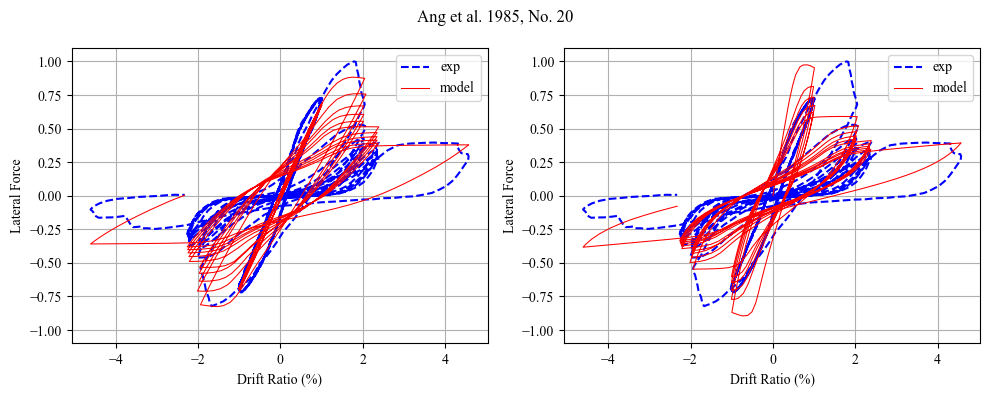



19
[1.60781e+00 5.37488e+00 1.01078e+00 3.86900e-01 5.50240e-01 6.37240e-01
 4.90880e+00 8.73180e-01 2.23787e+00 1.79000e-03 2.14558e+00 3.68960e-01
 1.85400e-02 2.05770e-01]
[1.2879    4.6712    1.0041    0.39524   0.41196   3.2024    4.0387
 0.70307   3.3341    0.0049104 1.1277    0.84373   0.027842  0.55296  ]


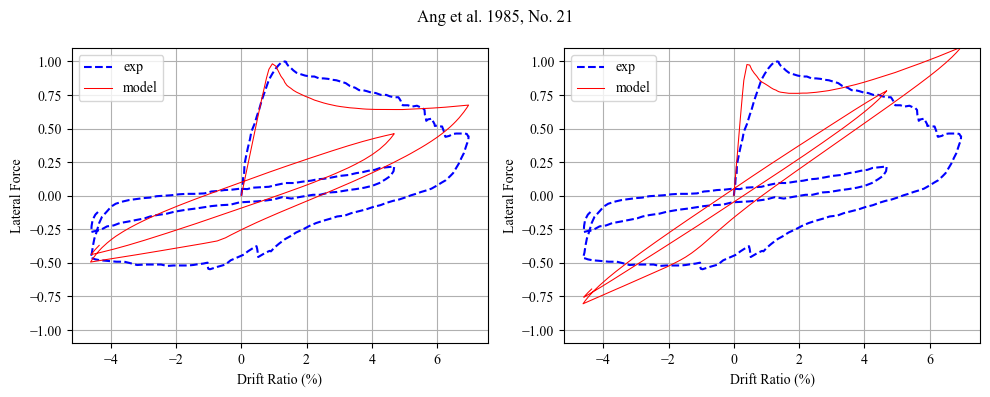



20
[1.62284e+00 8.04250e-01 1.03594e+00 2.92730e-01 4.20070e-01 2.56340e+00
 1.75331e+00 7.00480e-01 2.31511e+00 2.30000e-03 5.26271e+00 7.27720e-01
 4.42700e-02 1.24271e+00]
[1.4116    0.91883   1.0054    0.3168    0.28573   2.0859    2.136
 0.81982   2.625     0.0046633 2.2491    0.63607   0.025747  1.0626   ]


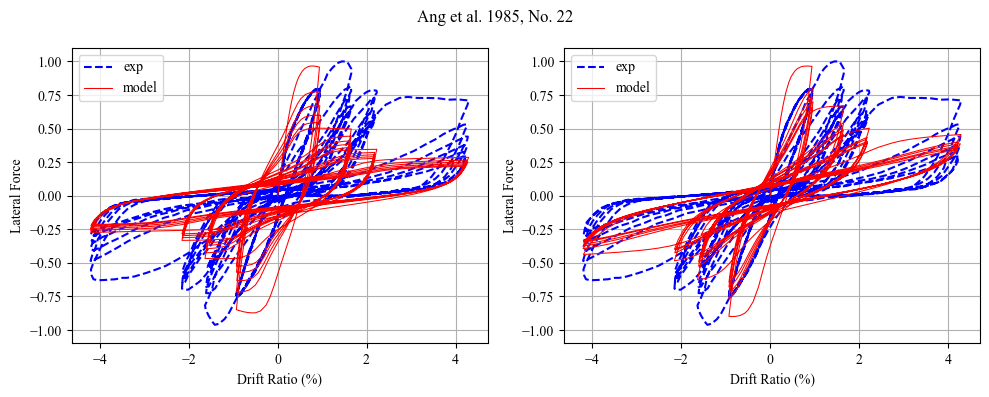



21
[6.75430e-01 6.53380e-01 9.76310e-01 6.09490e-01 4.46720e-01 2.60638e+00
 2.51887e+00 7.83540e-01 2.19188e+00 1.36000e-03 1.53905e+00 5.99630e-01
 3.35700e-02 3.12020e-01]
[1.2627    0.79184   1.0066    0.31884   0.28268   2.0934    2.394
 0.86056   3.3341    0.0078509 1.7127    0.71895   0.02563   0.5422   ]


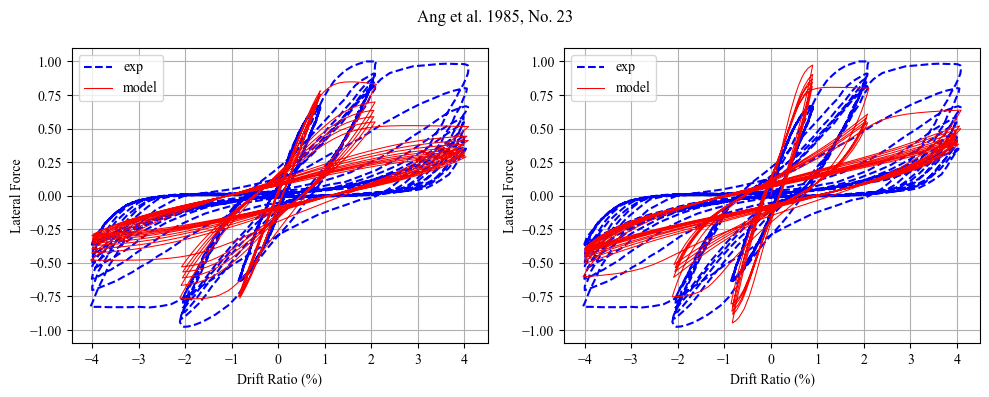



22
[1.26251e+00 7.65900e-01 9.56640e-01 3.10060e-01 2.82070e-01 3.50370e+00
 2.58456e+00 8.65990e-01 5.86965e+00 5.71000e-03 6.79582e+00 1.89669e+00
 1.36400e-02 3.00230e-01]
[1.4433   0.87718  1.0066   0.34575  0.3606   2.2012   1.7751   0.71344
 3.2689   0.011681 2.8439   0.83494  0.020403 0.5778  ]


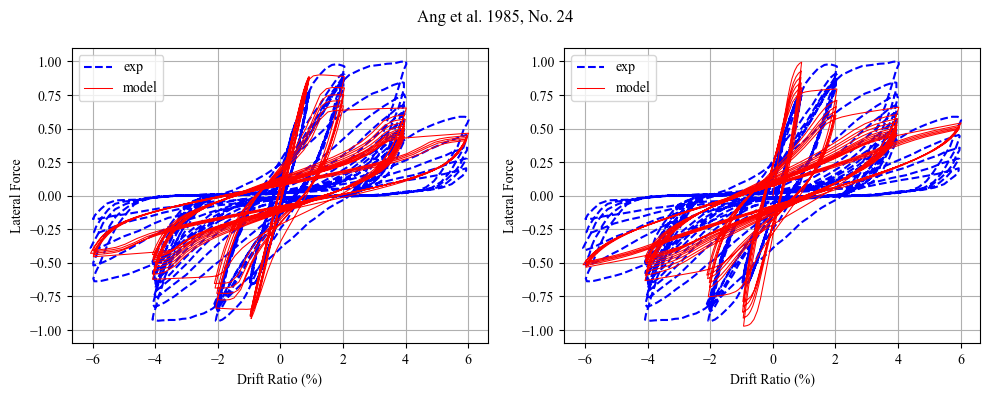



23
[1.90821 0.58049 1.04931 0.28453 0.32085 1.30439 1.01085 0.64332 8.86229
 0.01274 1.20151 1.22073 0.03669 0.87175]
[1.4674   0.97313  1.0066   0.33165  0.38493  2.4076   2.146    0.71019
 3.3341   0.010402 3.45     0.86689  0.01551  0.556   ]


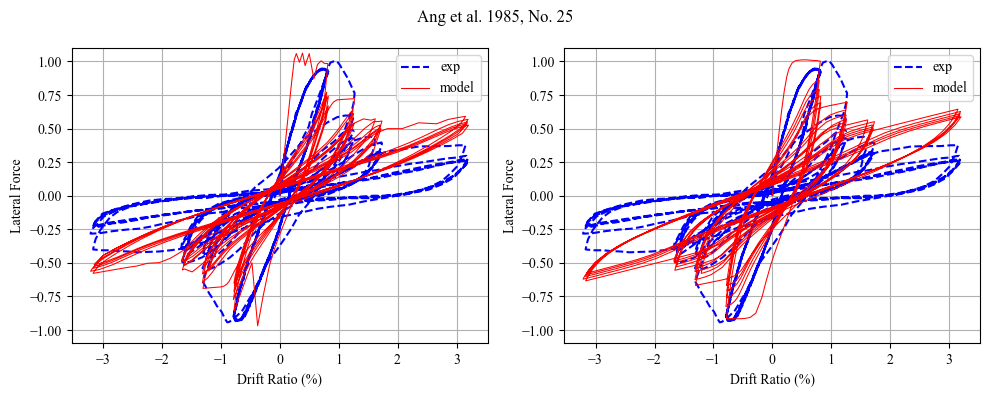



24
[1.35742e+00 3.88066e+00 9.89030e-01 1.70560e-01 3.05210e-01 3.66833e+00
 2.35251e+00 1.95440e-01 6.64668e+00 1.38000e-03 1.24373e+00 1.82450e+00
 1.60400e-02 1.11390e-01]
[1.2486    1.4032    1.0066    0.31472   0.36964   2.4693    2.3878
 0.71873   3.3341    0.0043065 2.7039    0.78553   0.02432   0.556    ]


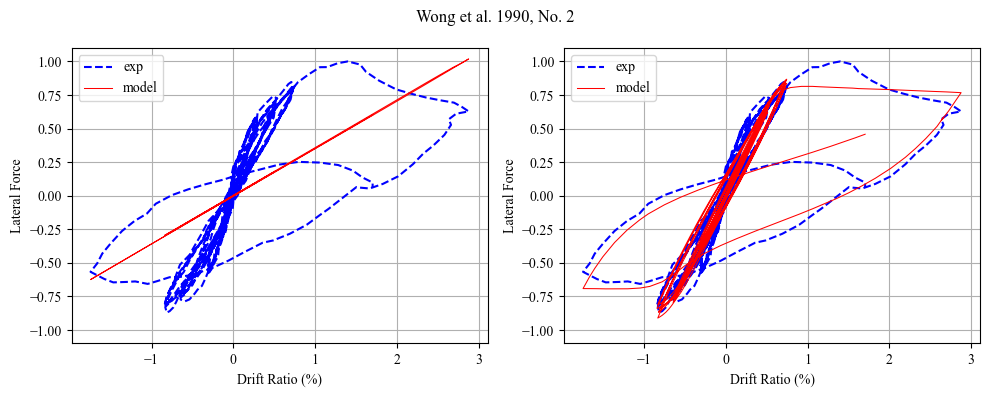



25
[0.50952 3.07558 1.03054 0.75563 0.43292 0.17444 0.1155  0.8234  5.71219
 0.00705 1.44405 1.8256  0.03907 0.8269 ]
[1.2486    1.5125    1.0066    0.55282   0.41734   2.3892    2.3937
 0.88098   3.3341    0.0058912 1.4274    0.86153   0.02665   0.556    ]


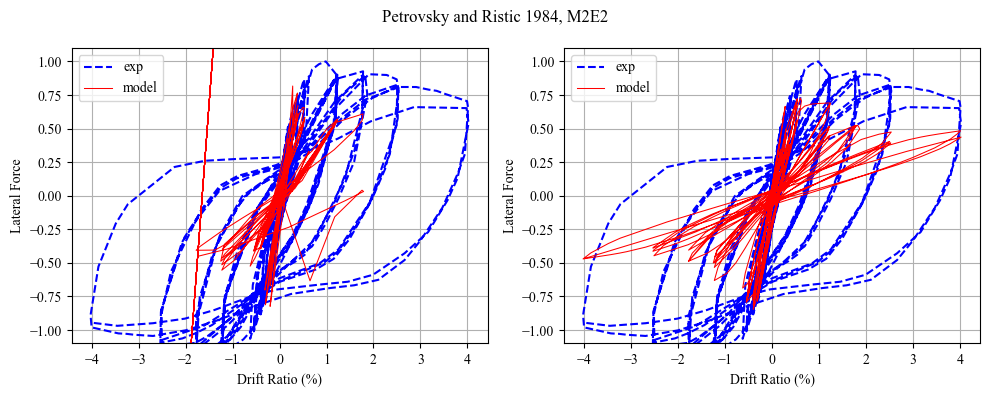



26
[6.37140e-01 5.27350e-01 1.02541e+00 3.65930e-01 4.91470e-01 2.06072e+00
 4.76160e+00 3.79250e-01 1.12510e+00 3.45000e-02 7.39779e+00 1.37890e-01
 7.26000e-03 1.38780e+00]
[1.2432   1.7331   1.0066   0.3459   0.60503  2.2723   3.7243   0.7135
 3.3341   0.014411 2.925    0.68453  0.011857 1.0748  ]


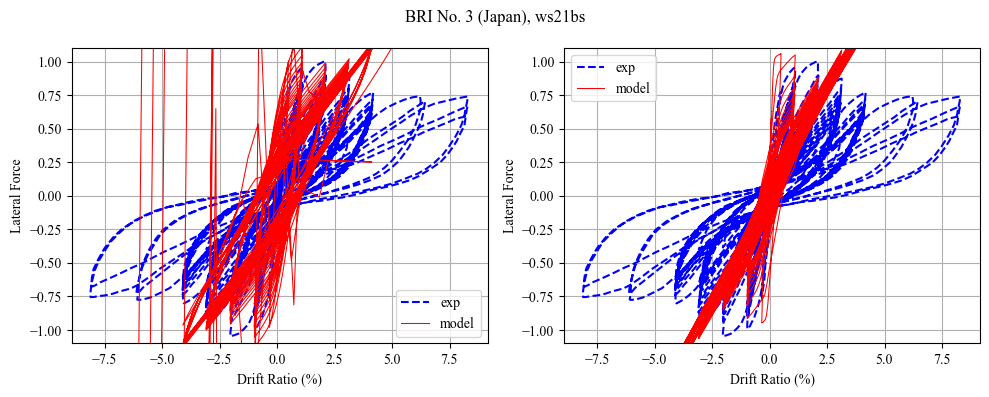



27
[6.07270e-01 8.17440e-01 9.69590e-01 7.48050e-01 2.94820e-01 1.58376e+00
 1.39118e+00 9.94380e-01 2.32546e+00 1.29000e-03 4.95436e+00 1.18357e+00
 2.42000e-03 2.31790e-01]
[1.2486    1.5126    1.0066    0.49223   0.36813   2.4734    2.3878
 0.7135    3.3341    0.0085689 2.9206    0.78553   0.016485  0.556    ]


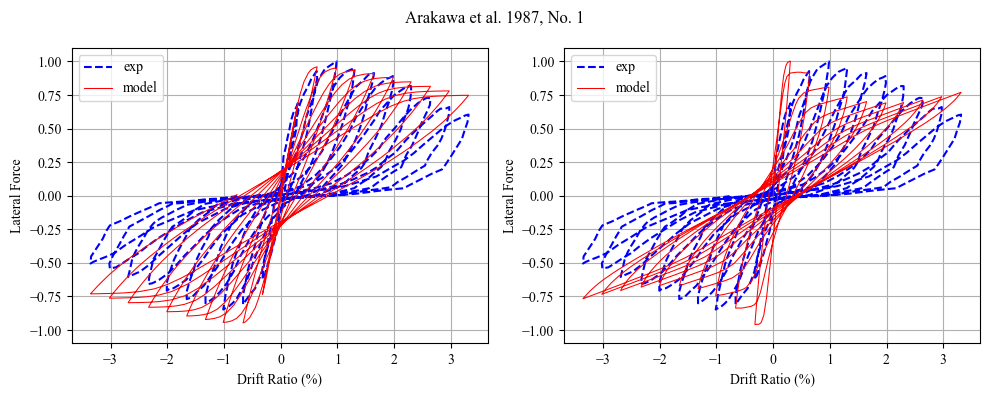



28
[1.04002e+00 7.37580e-01 9.93810e-01 3.55110e-01 8.49100e-02 3.72836e+00
 2.46759e+00 5.29190e-01 4.41064e+00 9.60000e-04 1.10550e+00 3.31430e-01
 2.98300e-02 2.73840e-01]
[1.2348    0.96514   1.0195    0.33051   0.34433   2.4186    2.1803
 0.7383    3.324     0.0068159 1.099     0.96069   0.024319  0.35311  ]


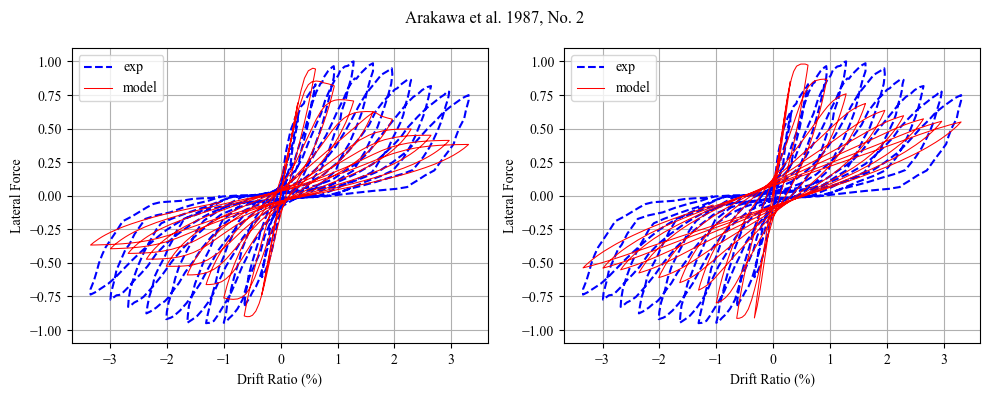



29
[0.70808 0.92385 1.00032 0.24388 0.38002 2.74065 2.77799 0.90202 1.34452
 0.00699 2.06073 1.54606 0.01059 0.21662]
[1.2431   0.81603  1.0065   0.33507  0.28253  2.4284   2.0409   0.69313
 3.3485   0.007826 1.9419   0.8015   0.021726 0.556   ]


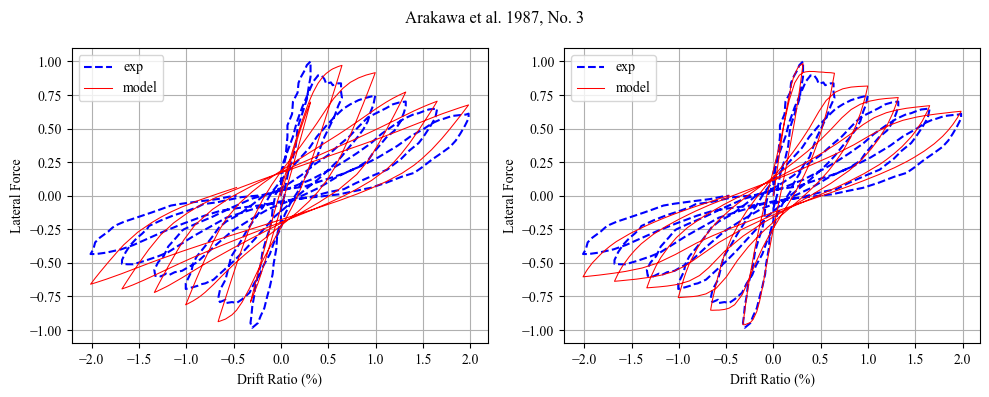



30
[1.08571e+00 1.81429e+00 1.02764e+00 2.91190e-01 2.54930e-01 2.12820e+00
 4.39781e+00 9.98590e-01 2.63931e+00 3.91000e-03 5.11105e+00 8.29800e-02
 1.58500e-02 3.39680e-01]
[1.2487    1.5204    1.0003    0.34801   0.46347   2.6868    2.3878
 0.87576   3.3364    0.0073741 1.7981    0.90027   0.033586  0.54107  ]


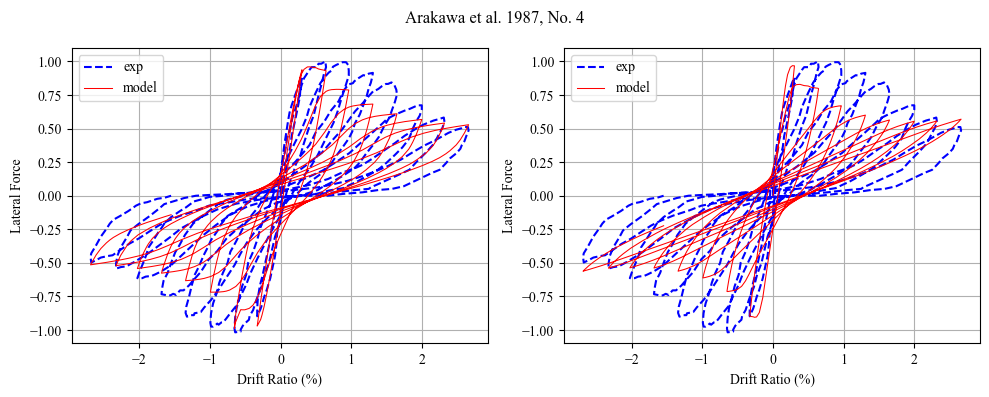



31
[1.50222e+00 1.61985e+00 1.04667e+00 1.06200e-01 2.35160e-01 1.83234e+00
 3.72429e+00 6.35060e-01 2.82849e+00 4.70000e-04 6.52020e-01 1.43082e+00
 1.92300e-02 2.28730e-01]
[1.3636    0.67286   1.0106    0.37974   0.33968   2.1239    2.486
 0.72705   3.3451    0.0068281 1.2153    0.67553   0.026047  0.556    ]


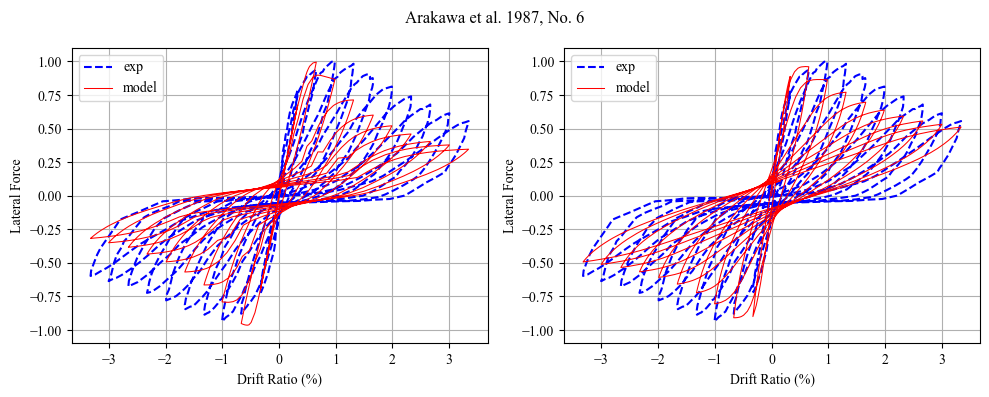



32
[1.60324 0.64473 1.00361 0.24641 0.09142 2.60873 1.63921 0.73862 4.86438
 0.00597 1.97426 1.39582 0.02819 1.21779]
[1.1682    1.5651    1.003     0.37982   0.27604   2.1187    2.4162
 0.59608   3.1037    0.0078463 1.8535    0.9713    0.022664  1.5302   ]


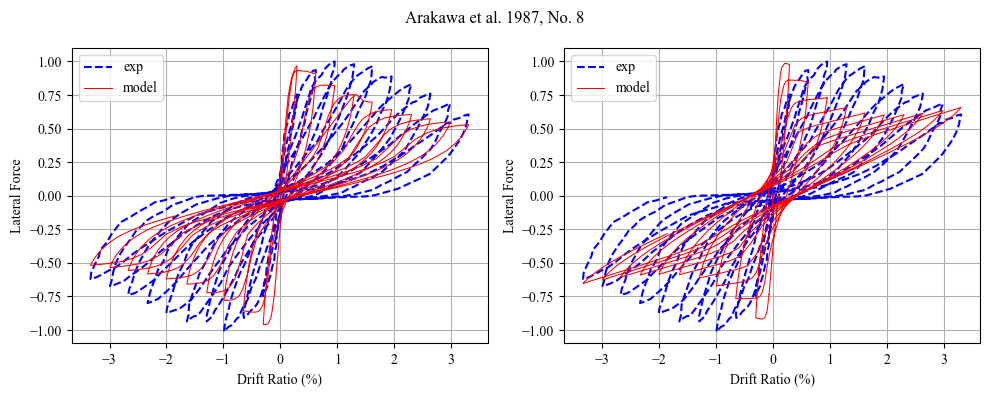



33
[9.30590e-01 1.96556e+00 1.04069e+00 1.81440e-01 1.53780e-01 1.78994e+00
 9.00440e-01 6.19190e-01 4.84470e+00 3.69000e-03 3.47648e+00 2.25350e-01
 6.75000e-03 2.01900e-01]
[1.2401   0.92166  1.0025   0.37219  0.39549  2.2376   2.1402   0.59994
 3.3369   0.008449 2.5682   0.7025   0.014064 0.556   ]


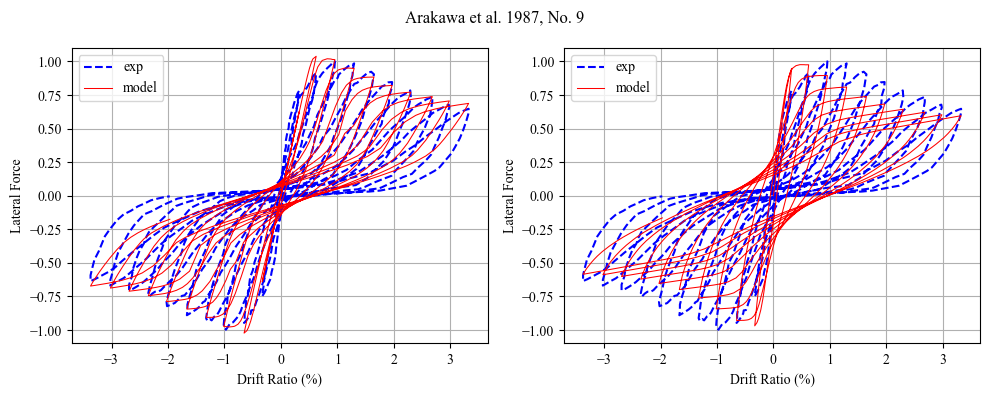



34
[0.83028 0.74489 0.95774 0.67197 0.32154 1.14258 0.48092 0.64425 2.04928
 0.00698 1.89336 0.1014  0.02804 1.62083]
[1.3416    1.2193    1.0066    0.35999   0.30686   2.2852    2.6966
 0.7135    3.4901    0.0057131 1.02      0.78514   0.026495  1.6843   ]


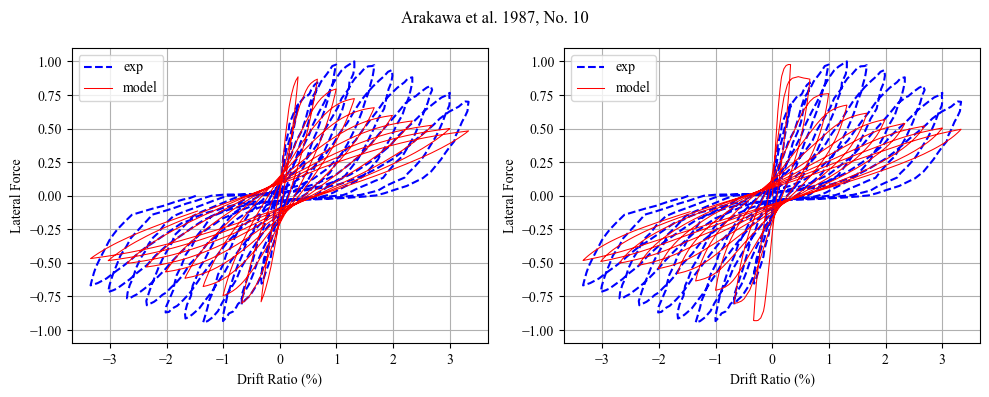



35
[1.22703 0.72236 1.02232 0.10435 0.21017 1.81331 3.62596 0.78618 2.46314
 0.00664 1.54231 0.32564 0.00577 1.80429]
[1.2498   0.51463  1.0066   0.3784   0.46561  2.226    1.6679   0.7135
 3.435    0.010445 1.7327   0.78229  0.014579 1.503   ]


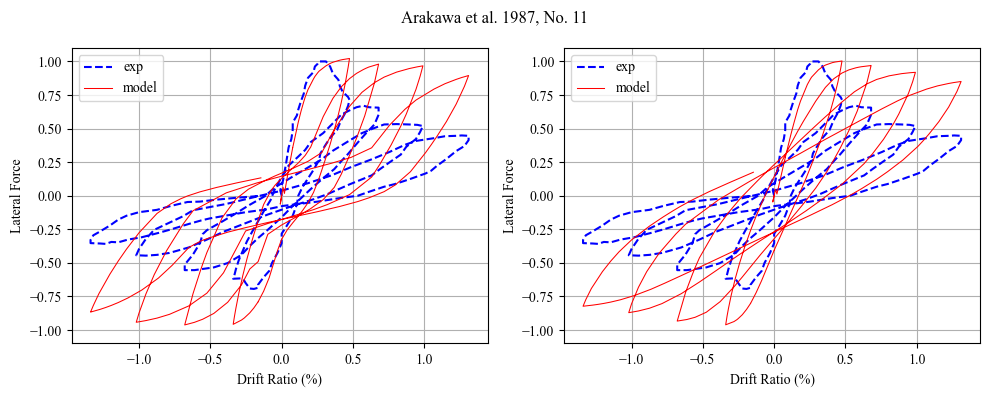



36
[1.70583e+00 1.96439e+00 9.58910e-01 6.89250e-01 2.77210e-01 4.99317e+00
 1.81183e+00 8.97740e-01 3.50590e+00 3.40000e-03 2.07308e+00 1.92729e+00
 4.26500e-02 5.97710e-01]
[1.2486    1.5385    1.0094    0.44589   0.37876   2.4678    2.3878
 0.96457   3.3249    0.0070918 1.2792    0.87585   0.026066  0.556    ]


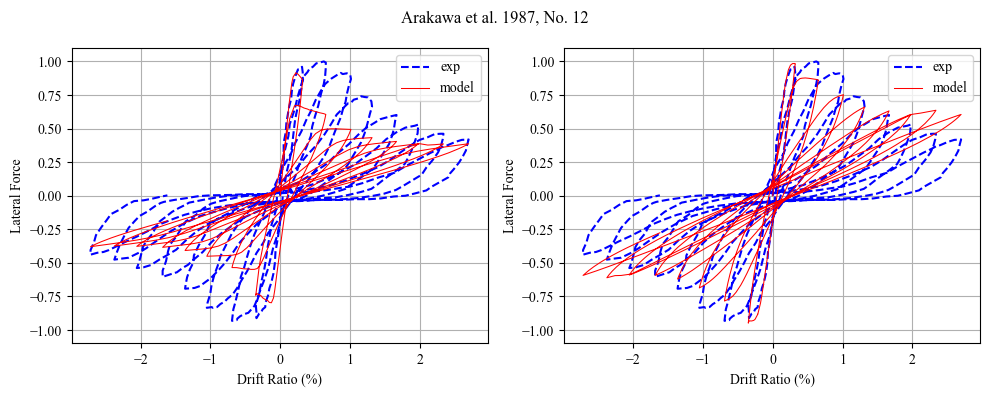



37
[1.24186e+00 2.81082e+00 1.04288e+00 3.81140e-01 6.02860e-01 3.04207e+00
 1.56985e+00 5.13210e-01 1.75422e+00 1.51000e-03 5.05490e-01 8.86130e-01
 7.82000e-03 5.63950e-01]
[1.2556    1.0527    1.0159    0.51558   0.42867   2.2855    2.3878
 0.71355   3.3305    0.0075167 1.4897    0.80123   0.027488  0.556    ]


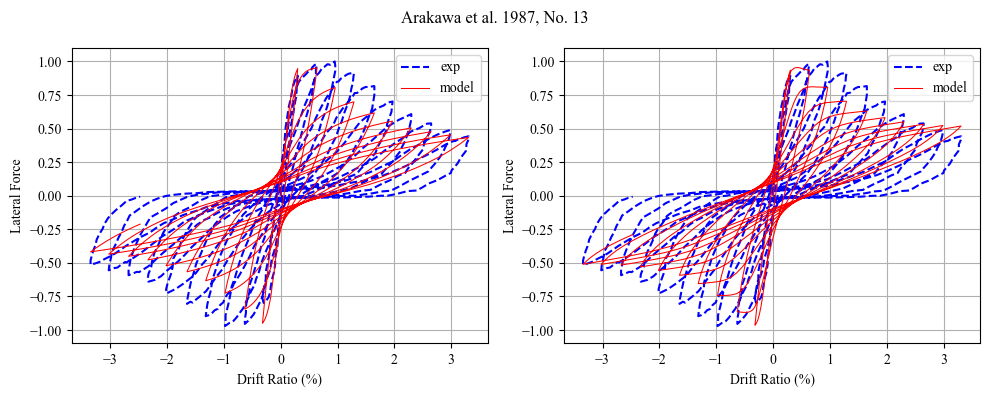



38
[0.90291 0.68087 0.99487 0.29756 0.19458 4.17857 3.75354 0.68638 2.72533
 0.00421 0.88818 1.52778 0.03441 0.6692 ]
[1.2302   0.76619  1.0059   0.49117  0.35317  2.171    2.2923   0.7114
 3.3865   0.008107 1.1375   0.93799  0.022904 0.556   ]


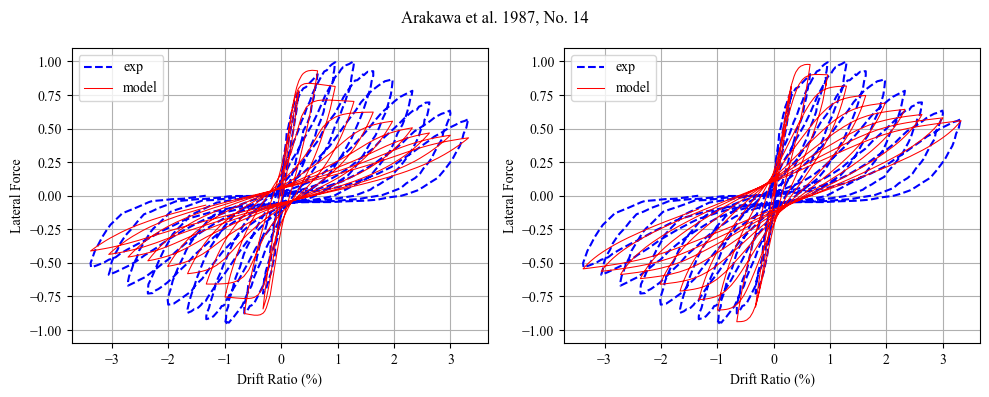



39
[7.63660e-01 9.94640e-01 9.79770e-01 9.12650e-01 7.24280e-01 2.24342e+00
 2.20536e+00 4.96750e-01 3.44760e+00 2.73000e-03 5.93390e-01 1.85500e-02
 1.41600e-02 1.85015e+00]
[1.2312   0.53347  1.0119   0.44781  0.33564  2.7374   2.2867   0.54167
 3.3715   0.00831  2.2942   0.73     0.014303 0.556   ]


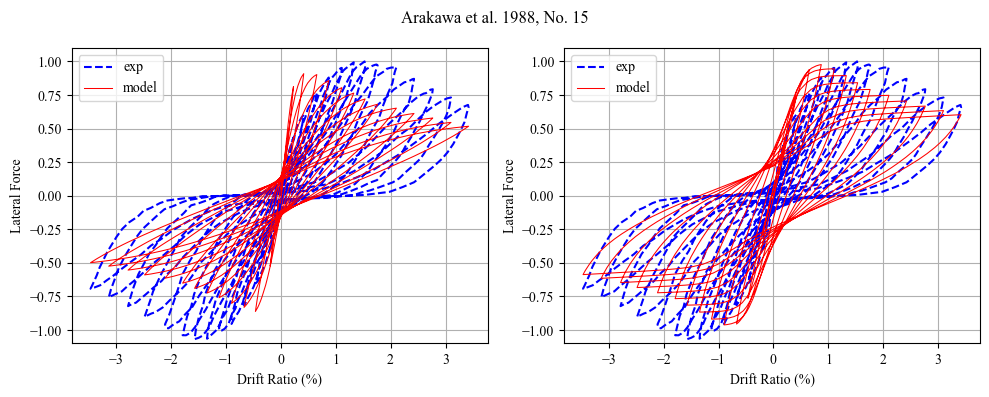



40
[5.08190e-01 5.48050e-01 9.72690e-01 3.85560e-01 2.95720e-01 1.65594e+00
 1.61967e+00 6.72120e-01 5.79913e+00 4.16000e-03 1.40388e+00 9.49400e-01
 1.84700e-02 2.86150e-01]
[1.2592    0.82896   1.0071    0.32876   0.27034   2.0962    1.6283
 0.77233   3.2958    0.0083398 2.7254    0.95677   0.02484   0.55699  ]


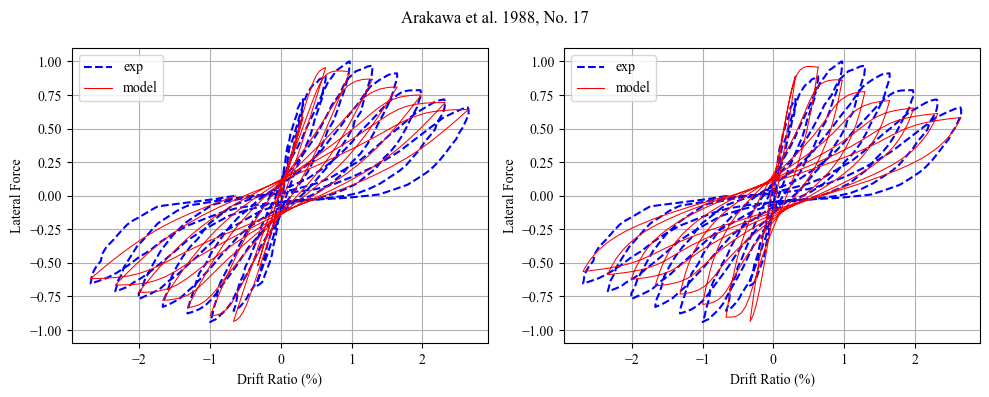



41
[1.74691 0.53826 0.99114 0.56011 0.15889 2.1948  0.893   0.774   6.00632
 0.0131  3.27828 0.63414 0.03535 0.64459]
[1.3005    1.6248    0.999     0.36205   0.25659   2.1239    1.6819
 0.77929   3.3434    0.0066034 1.1238    0.85492   0.027146  0.36434  ]


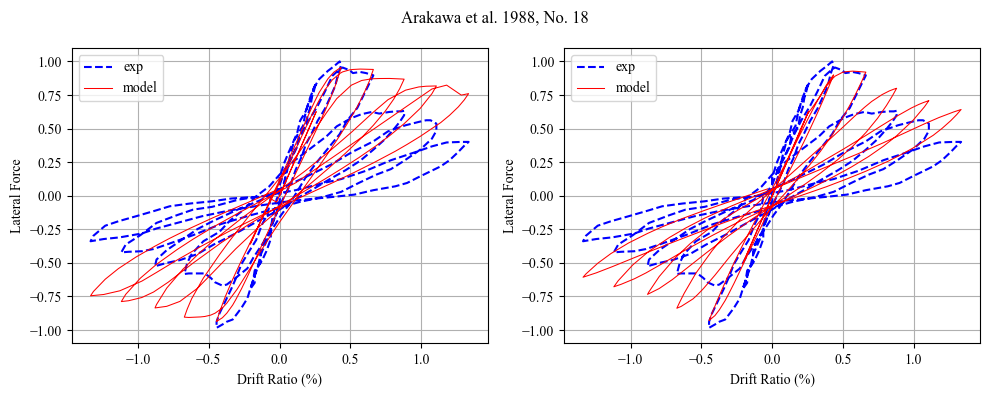



42
[1.29204 1.58962 1.02903 0.25535 0.61803 4.40528 3.04268 0.79538 3.47352
 0.00871 0.68931 1.19727 0.04611 0.53273]
[1.2486    1.7176    1.0066    0.34253   0.31198   2.4448    2.3878
 0.71328   3.3341    0.0059446 2.9133    1.0427    0.02512   0.41719  ]


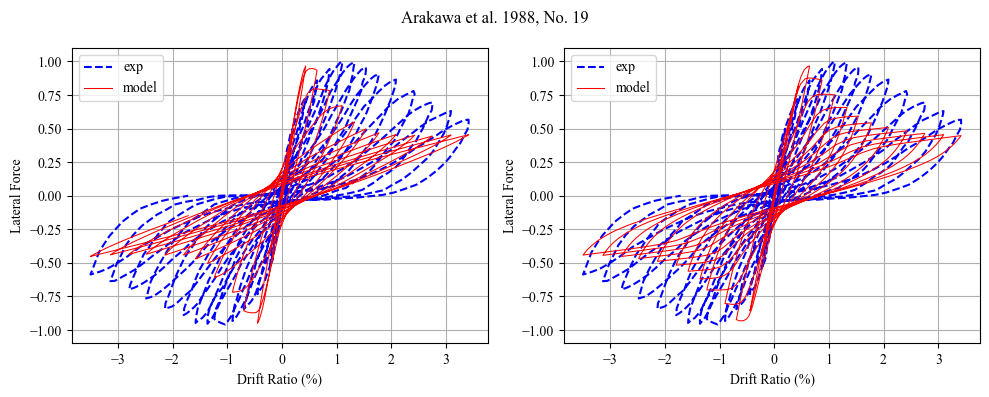



43
[1.78141 0.94547 1.04849 0.32183 0.12603 3.23582 0.3412  0.55912 2.00581
 0.01126 2.63487 0.14851 0.02693 0.32464]
[1.3795    1.5463    1.0033    0.36967   0.21633   2.7077    2.0945
 0.71267   3.7755    0.0075088 2.349     0.77391   0.026357  0.64126  ]


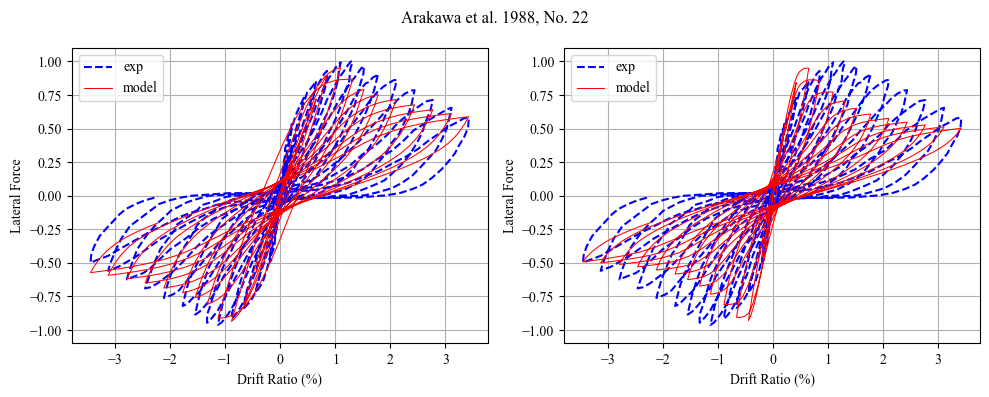



44
[1.46582 0.56178 1.04274 0.08607 0.31696 4.23749 4.94899 0.47936 8.00795
 0.01544 0.61594 0.07094 0.03705 0.91686]
[1.4488    1.2307    1.0072    0.43937   0.24616   2.8835    3.8711
 0.7135    5.1578    0.0081257 1.1725    0.65019   0.026858  0.47062  ]


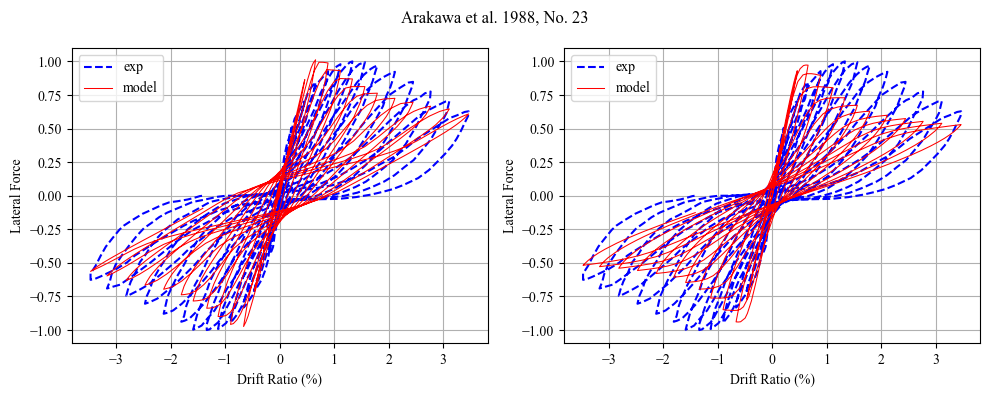



45
[1.76807 0.67795 0.98827 0.69633 0.1644  0.47636 1.5153  0.94676 2.57661
 0.01395 0.6048  1.39073 0.02594 1.8867 ]
[1.3422    0.7834    1.001     0.33777   0.23962   2.6283    2.02
 0.76318   2.7206    0.0067973 2.4109    0.81139   0.025044  0.90631  ]


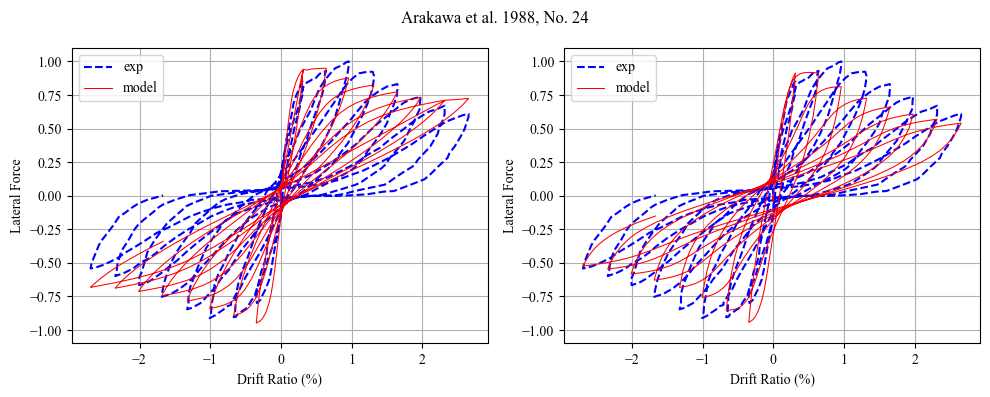



46
[1.29971 0.55273 0.97731 0.49496 0.54703 0.43542 0.20424 0.5704  3.70307
 0.01119 0.85068 0.82968 0.02871 0.73844]
[1.2157    0.76404   1.0026    0.47477   0.3681    2.9064    2.4379
 0.56448   3.4013    0.0069438 2.6698    0.76001   0.027464  0.98775  ]


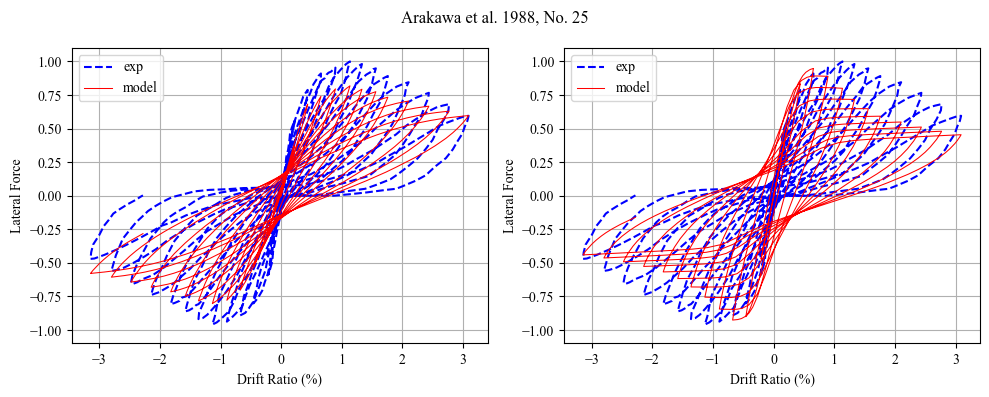



47
[1.2882  0.57528 1.02597 0.296   0.25407 3.48517 2.28939 0.81461 7.22915
 0.0205  1.38124 0.08394 0.03374 1.27069]
[1.2679    1.276     1.0127    0.50083   0.40422   2.8939    2.3898
 0.71476   4.519     0.0070292 1.3717    0.60475   0.026831  0.66621  ]


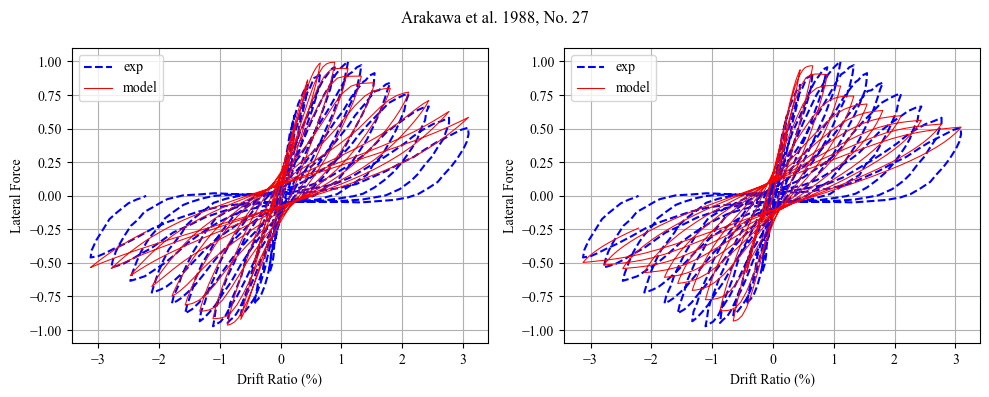



48
[0.89004 1.07009 1.01032 0.87042 0.72485 2.13051 4.19978 0.99681 2.14092
 0.00907 0.71753 0.68399 0.03505 1.01764]
[1.2486    1.5125    1.011     0.55224   0.38769   1.9156    2.3804
 0.7135    3.3542    0.0092942 1.2923    0.45987   0.026855  0.556    ]


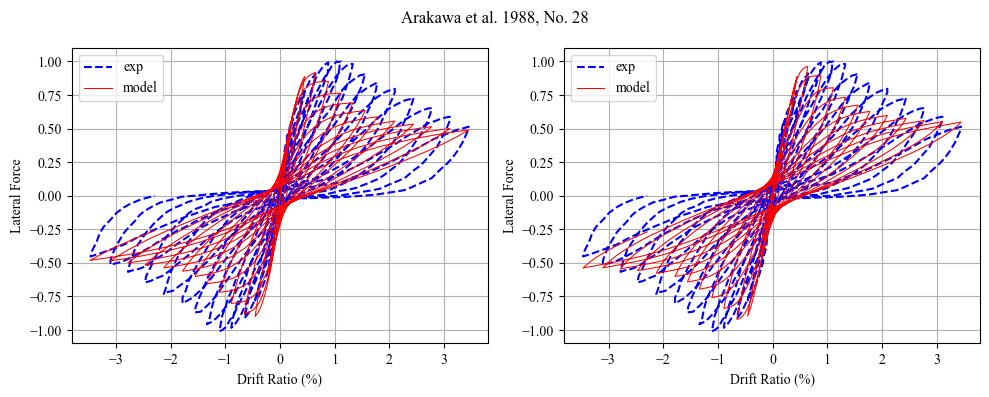



49
[1.85164e+00 8.06759e+00 9.77880e-01 3.71520e-01 8.37200e-02 3.95688e+00
 4.65849e+00 8.17770e-01 6.14359e+00 7.00000e-04 2.40790e+00 8.69260e-01
 2.11000e-03 4.28850e-01]
[1.3474    3.5995    1.0113    0.41365   0.2964    3.1539    4.3629
 0.73944   5.8899    0.0075469 2.3961    0.47346   0.027816  0.79898  ]


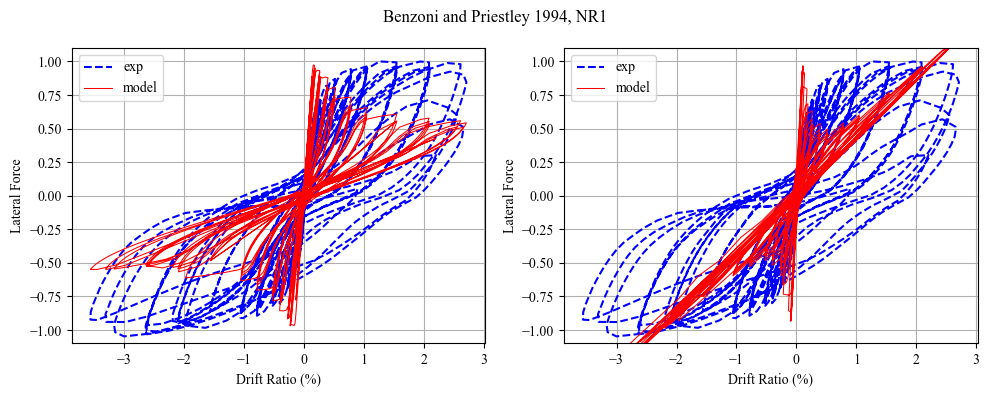



50
[1.78186e+00 6.83441e+00 9.97220e-01 8.22600e-02 8.28840e-01 1.86004e+00
 2.58204e+00 5.19980e-01 2.26468e+00 2.21000e-03 7.85690e-01 1.28971e+00
 1.33000e-03 2.55440e-01]
[1.2736   1.1862   1.0066   0.32509  0.52225  2.0489   1.5415   0.7135
 3.3341   0.013769 4.4041   0.77712  0.0108   0.55757 ]


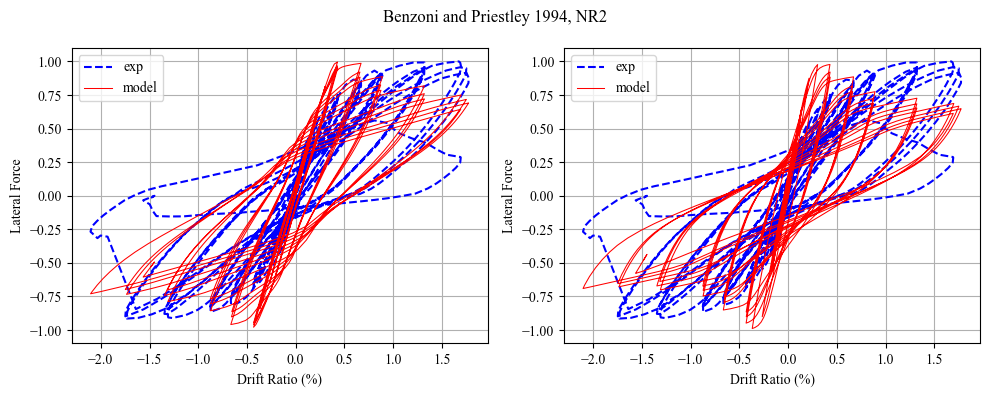



51
[1.81257 0.95506 0.99843 0.79143 0.41256 1.21424 0.4606  0.76453 3.69188
 0.03009 4.21611 0.99262 0.03117 0.19445]
[1.2988   3.4939   1.0066   0.30491  0.31881  1.8443   2.4804   0.71354
 3.3341   0.011046 5.0473   0.66843  0.020426 0.556   ]


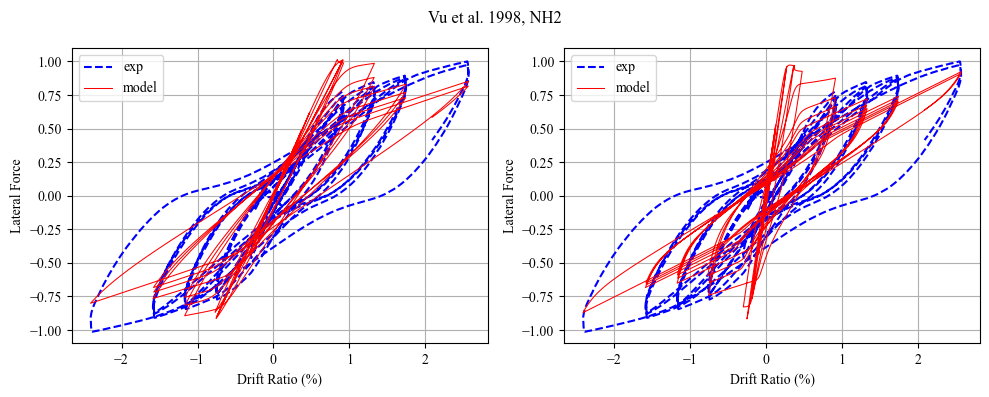



52
[1.68462 0.55557 1.0217  0.23469 0.17361 0.66103 1.47196 0.86844 1.93218
 0.03395 2.53378 0.75521 0.01981 0.83381]
[1.2263    1.1631    1.0066    0.3562    0.42596   1.9548    2.741
 0.71297   3.3341    0.015098  4.802     0.78444   0.0080237 0.556    ]


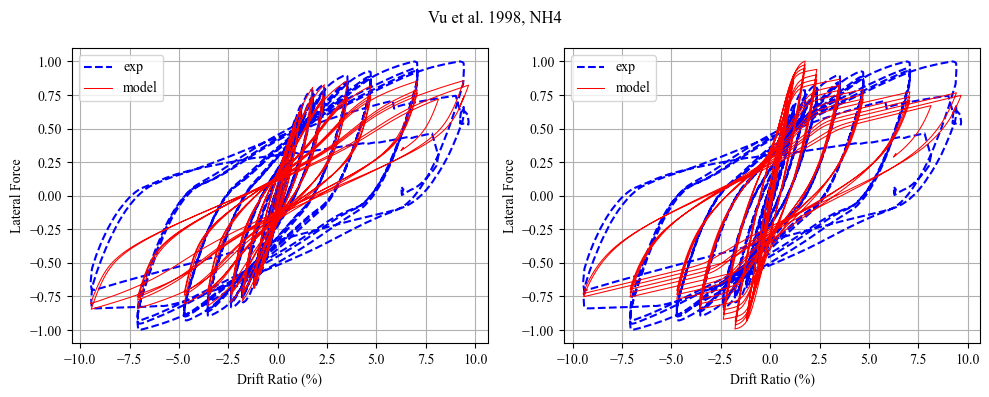



53
[1.05371 0.54094 1.03298 0.46773 0.5484  2.4149  3.80166 0.43074 1.29757
 0.02309 7.54237 0.98804 0.01251 0.31937]
[1.2486   1.0265   1.0066   0.40936  0.3681   2.2665   2.3878   0.7135
 3.3341   0.012444 2.9096   0.78553  0.013096 0.556   ]


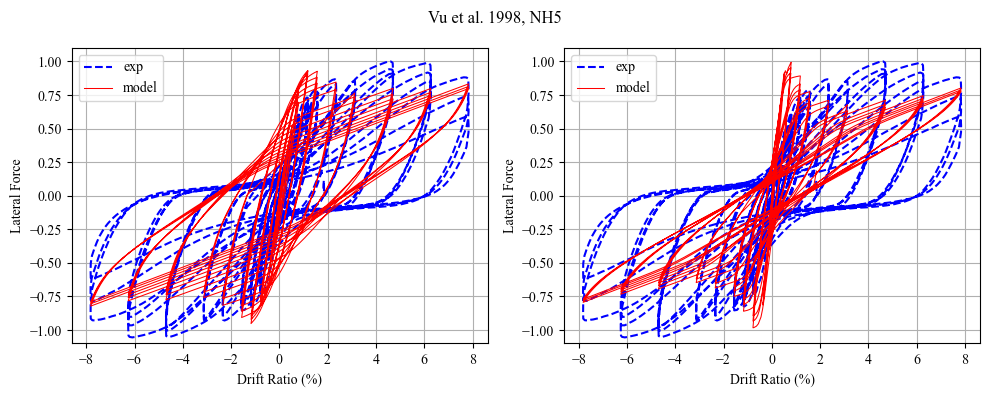



54
[1.30670e+00 7.71340e-01 9.81760e-01 4.34960e-01 9.36040e-01 1.24265e+00
 1.19233e+00 7.89090e-01 1.94659e+00 1.11200e-02 7.70173e+00 1.09954e+00
 7.16000e-03 2.58230e-01]
[1.3543    0.99489   1.0066    0.34625   0.37952   1.8416    2.1194
 0.84067   3.3341    0.016116  6.9722    0.75848   0.0096004 0.57143  ]


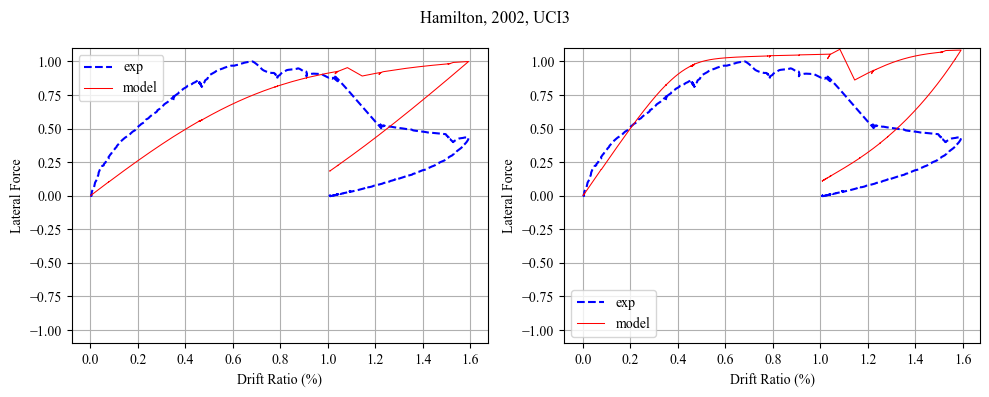



55
[1.74153e+00 2.84581e+00 9.62080e-01 2.79460e-01 4.23500e-02 3.61427e+00
 4.70746e+00 3.18810e-01 1.74514e+00 5.80000e-04 2.95891e+00 1.71361e+00
 4.20500e-02 7.19010e-01]
[1.1292   1.1626   1.0085   0.3176   0.31049  2.4578   2.4181   0.33014
 2.3232   0.0157   3.7963   0.73244  0.019815 0.23445 ]


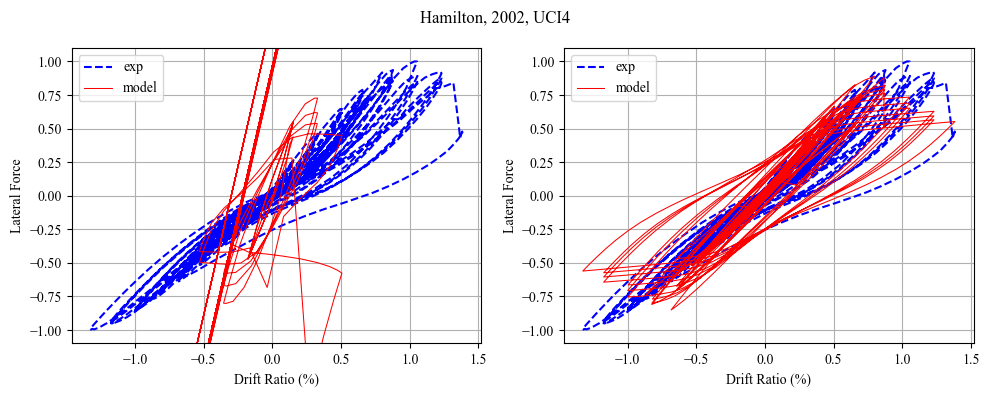



56
[0.84434 1.05997 1.01053 0.45324 0.24489 1.46486 2.79247 0.32958 1.75601
 0.02912 2.40839 0.62819 0.0129  0.20721]
[1.402    1.7494   0.98581  0.31122  0.22834  2.838    3.4162   0.31939
 2.3163   0.012783 3.9838   1.087    0.026607 0.70628 ]


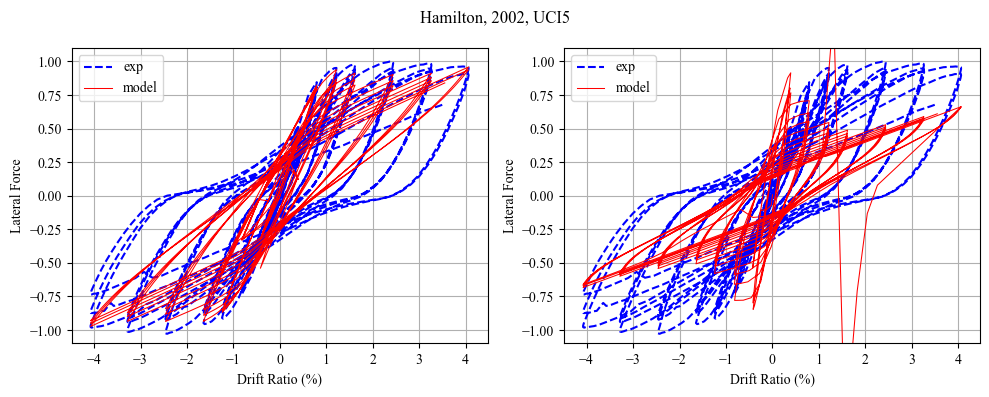



57
[1.31337e+00 9.31440e-01 1.00364e+00 6.39700e-02 3.92760e-01 2.36921e+00
 1.13967e+00 7.42810e-01 3.13964e+00 1.70600e-02 9.52982e+00 1.64530e-01
 2.71000e-03 2.28390e-01]
[1.2531   1.8452   1.0066   0.32543  0.48963  2.5498   2.5226   0.71357
 3.3341   0.010078 2.634    0.79036  0.013822 0.58954 ]


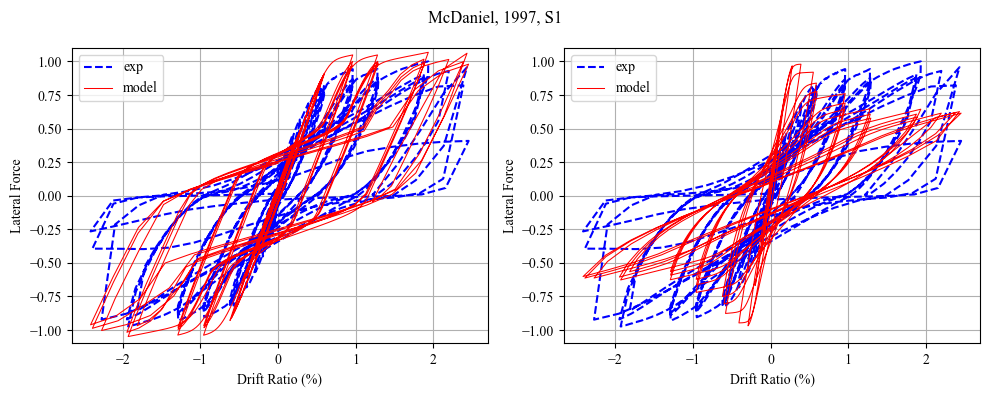



58
[7.05260e-01 8.07710e-01 1.04538e+00 1.58520e-01 2.50750e-01 1.70557e+00
 1.59857e+00 8.65000e-01 3.34822e+00 6.50000e-03 7.54269e+00 1.98830e-01
 6.54000e-03 2.70580e-01]
[1.2181   1.8849   1.0238   0.31602  0.29973  2.5215   1.9619   0.71351
 1.9909   0.01156  7.4854   0.7688   0.025095 0.20568 ]


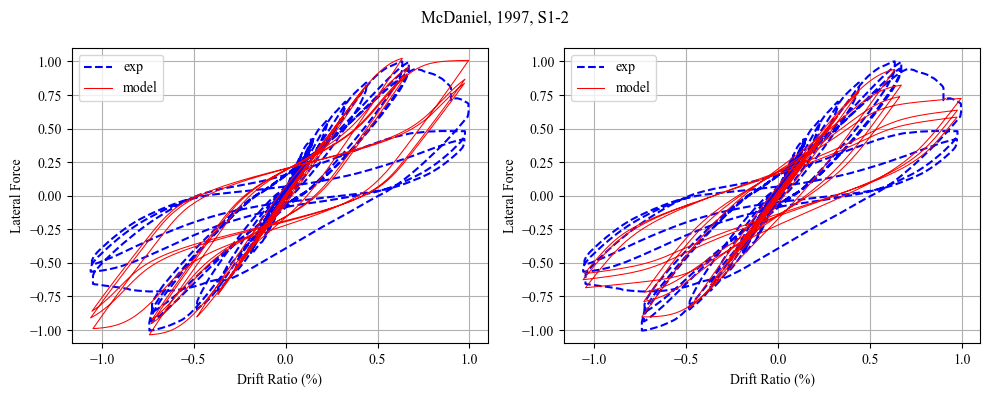



59
[9.22960e-01 2.66971e+00 1.03648e+00 3.76040e-01 4.60500e-02 9.43620e-01
 1.19884e+00 6.83650e-01 1.44654e+00 7.23000e-03 9.70236e+00 6.52920e-01
 3.38600e-02 1.86620e-01]
[1.1756   0.94145  1.0207   0.30723  0.35376  2.5626   2.1071   0.71497
 2.9437   0.010881 7.6325   0.654    0.022276 0.24604 ]


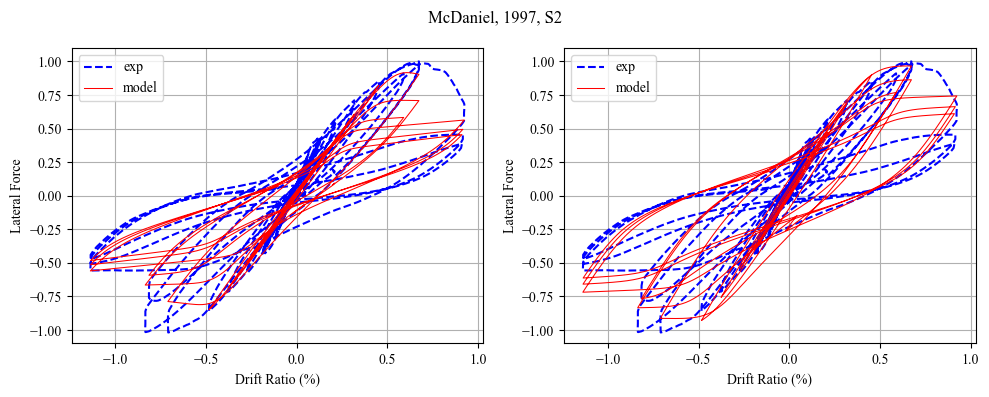

In [20]:
# Load data from calibrated curves folder

cwd = os.getcwd()
calibrated_curves_dir = os.path.join(cwd, 'calibrated_curves_01')
all_tests = os.listdir(calibrated_curves_dir)

n_tests = len(all_tests)

cc = 0
for ii in range(0, n_tests):
    
    # Load calibrated curve data
    test_data = load_json(os.path.join(calibrated_curves_dir, all_tests[ii]))
    if test_data['FailureType'] != "Flexure":
        
        # First, run the model with calibrated parameters
        print(cc)
        model_params = cal_params.iloc[cc, :].values
        # model_params[1] = 10.0
        print(model_params)

        plt.figure(figsize=(10, 4))
        plt.subplot(1,2,1)
        run_model(model_params, test_data, show_plots=True)
        plt.ylim([-1.1, 1.1])

        # Now, plot the surrogate predictions
        surr_params = surrogate_data.iloc[cc, 7+14:21+14].values
        # surr_params[-1] = 1.0
        print(surr_params)
        plt.subplot(1,2,2)
        run_model(surr_params, test_data, show_plots=True)
        plt.ylim([-1.1, 1.1])
        plt.suptitle(test_data['Name'])
        plt.tight_layout()
        plt.show()

        print('\n')
        cc += 1
    pass